<a href="https://colab.research.google.com/github/yashv04/Performance-Analysis/blob/main/Bowling_Analysis_with_a_Problem_Statement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('max.colwidth', None)
pd.set_option('display.expand_frame_repr', False)


In [ ]:
deliveries = pd.read_csv('deliveries.csv')
matches = pd.read_csv('matches.csv')

In [ ]:
df = deliveries.copy()

In [ ]:
df.dismissal_kind.unique()

array([nan, 'caught', 'bowled', 'run out', 'lbw', 'caught and bowled',
       'stumped', 'retired hurt', 'hit wicket', 'obstructing the field'],
      dtype=object)

In [ ]:
type(df.player_dismissed[0])

float

In [ ]:
type(df.dismissal_kind[11])

str

In [ ]:
def is_bowlers_wicket(player_dismissed, dismissal_kind):
  if type(player_dismissed)== str:
    if dismissal_kind not in ['run out', 'retired hurt', 'obstructing the field']:
       return 1
    else :
      return 0
  else :
    return 0

In [ ]:
df['isBowlerWk'] = df.apply(lambda x: is_bowlers_wicket(x['player_dismissed'], x['dismissal_kind']), axis =1)

In [ ]:
  df['isDot']= df['batsman_runs'].apply(lambda x: 1 if x==0 else 0)
  df['isOne']= df['batsman_runs'].apply(lambda x: 1 if x==1 else 0)
  df['isTwo']= df['batsman_runs'].apply(lambda x: 1 if x==2 else 0)
  df['isThree']= df['batsman_runs'].apply(lambda x: 1 if x==3 else 0)
  df['isFour']= df['batsman_runs'].apply(lambda x: 1 if x==4 else 0)
  df['isSix']= df['batsman_runs'].apply(lambda x: 1 if x==6 else 0)

  runs = pd.DataFrame(df.groupby(['batsman', 'match_id'])['batsman_runs'].sum().reset_index()).groupby(['batsman'])['batsman_runs'].sum().reset_index().rename(columns={'batsman_runs':'runs'})
  innings = pd.DataFrame(df.groupby(['batsman'])['match_id'].apply(lambda x: len(list(np.unique(x)))).reset_index()).rename(columns = {'match_id':'innings'})
  balls = pd.DataFrame(df.groupby(['batsman'])['match_id'].count()).reset_index().rename(columns = {'match_id':'balls'})
  dismissals = pd.DataFrame(df.groupby(['batsman'])['player_dismissed'].count()).reset_index().rename(columns = {'player_dismissed':'dismissals'})


  dots = pd.DataFrame(df.groupby(['batsman'])['isDot'].sum()).reset_index().rename(columns = {'isDot':'dots'})
  ones = pd.DataFrame(df.groupby(['batsman'])['isOne'].sum()).reset_index().rename(columns = {'isOne':'ones'})
  twos = pd.DataFrame(df.groupby(['batsman'])['isTwo'].sum()).reset_index().rename(columns = {'isTwo':'twos'})
  threes = pd.DataFrame(df.groupby(['batsman'])['isThree'].sum()).reset_index().rename(columns = {'isThree':'threes'})
  fours = pd.DataFrame(df.groupby(['batsman'])['isFour'].sum()).reset_index().rename(columns = {'isFour':'fours'})
  sixes = pd.DataFrame(df.groupby(['batsman'])['isSix'].sum()).reset_index().rename(columns = {'isSix':'sixes'})

In [ ]:
mega = pd.merge(innings, balls, on = 'batsman').merge(runs, on = 'batsman').merge(dismissals, on = 'batsman').merge(dots, on = 'batsman').merge

In [ ]:
#dot% vs no. of dismissals in innings 1 & 2

In [ ]:
def bowler_stats(df, current_innings):
  df = df[df.inning == current_innings] # Changed df to filtered_df for clarity
  df.reset_index(drop = True, inplace = True)

  # Use filtered_df for calculations instead of df
  df['isDot'] = df.apply(lambda x: 1 if x['total_runs'] == 0 else 0, axis = 1)
  df['isOne'] = df.apply(lambda x: 1 if x['total_runs'] == 1 else 0, axis = 1)
  df['isTwo'] = df.apply(lambda x: 1 if x['total_runs'] == 2 else 0, axis = 1)
  df['isThree'] = df.apply(lambda x: 1 if x['total_runs'] == 3 else 0, axis = 1)
  df['isFour'] = df.apply(lambda x: 1 if x['batsman_runs'] == 4 else 0, axis = 1)
  df['isSix'] = df.apply(lambda x: 1 if x['batsman_runs'] == 6 else 0, axis = 1)

  # Use filtered_df for groupby operations
  runs = pd.DataFrame(df.groupby('bowler')['total_runs'].sum()).reset_index().rename(columns = {'total_runs':'runs'})
  innings = pd.DataFrame(df.groupby('bowler')['match_id'].nunique()).reset_index().rename(columns = {'match_id':'innings'})
  balls = pd.DataFrame(df.groupby('bowler')['match_id'].count()).reset_index().rename(columns = {'match_id':'balls'})
  dismissals = pd.DataFrame(df.groupby('bowler')['isBowlerWk'].sum()).reset_index().rename(columns = {'isBowlerWk':'dismissals'})
  dots = pd.DataFrame(df.groupby('bowler')['isDot'].sum()).reset_index().rename(columns = {'isDot':'dots'})
  # ... (rest of the groupby operations using filtered_df) ...

  # Merge the DataFrames
  df = pd.merge(innings, balls, on = 'bowler').merge(dismissals, on = 'bowler').merge(runs, on = 'bowler').merge(dots, on = 'bowler')
  df['dot%'] = df.apply(lambda x: x['dots']/x['balls']*100, axis = 1)

  return df

In [ ]:
df1 = bowler_stats(df, 1)
df2 = bowler_stats(df, 2)

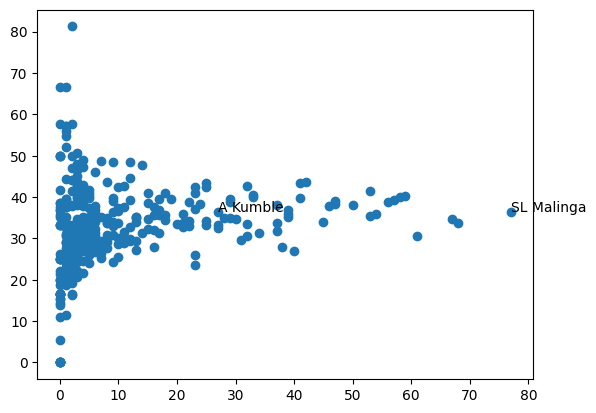

In [ ]:
plt.scatter(df1['dismissals'], df1['dot%'])
selected_bowlers = ['A Kumble', 'SL Malinga']
annotations = list(df1['bowler'])
for i, j in enumerate(annotations):
  if j in selected_bowlers:
     plt.annotate(j, (df1['dismissals'][i], df1['dot%'][i]))

plt.show()

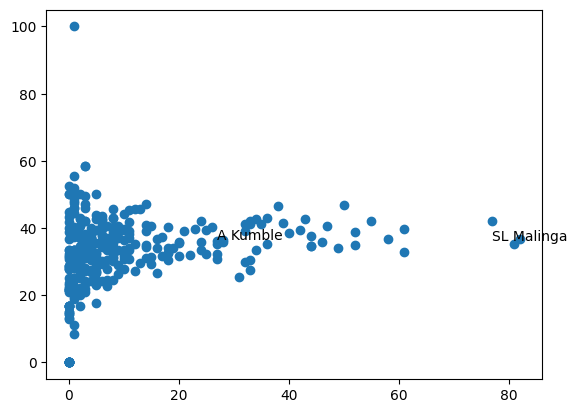

In [ ]:
plt.scatter(df2['dismissals'], df2['dot%'])
selected_bowlers = ['A Kumble', 'SL Malinga']
annotations = list(df1['bowler'])
for i, j in enumerate(annotations):
  if j in selected_bowlers:
     plt.annotate(j, (df1['dismissals'][i], df1['dot%'][i]))
plt.show()

In [ ]:
df1['dot%'].mean(), df2['dot%'].mean()

(32.870347616186315, 32.693540117484446)

In [ ]:
# case 2, bowlers against opposition

In [ ]:
def show_player(selected_player):

 plt.figure(figsize = (12,6))

 total_wickets = df[df.bowler == selected_player].groupby(['bowler'])['isBowlerWk'].sum().item()

 df[df.bowler == selected_player].groupby(['batting_team'])['isBowlerWk'].sum().sort_values(ascending = True).plot(kind = 'barh', color = 'green')
 plt.title(selected_player +  " - against all oppositions" + "(Wks:" + str(total_wickets)+")")
 plt.xlabel('Wickets')
 plt.ylabel('Opposition Team')
 plt.show()

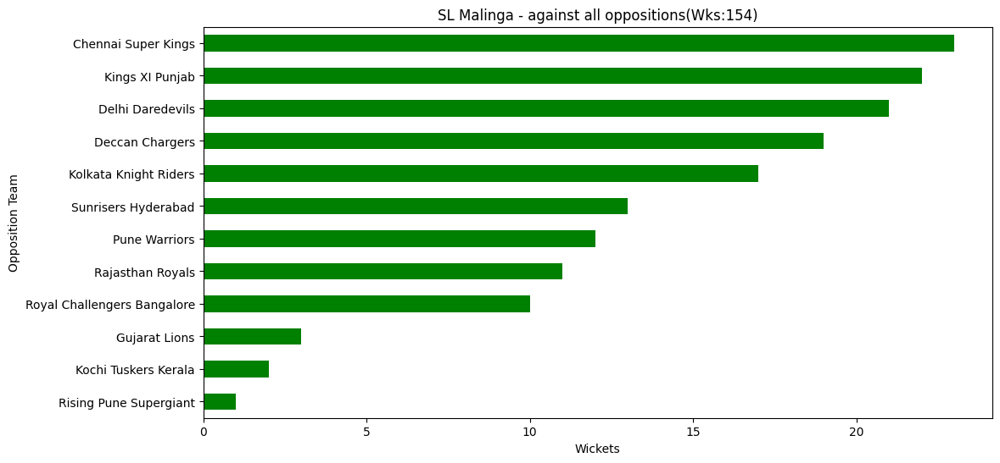

In [ ]:
show_player('SL Malinga')

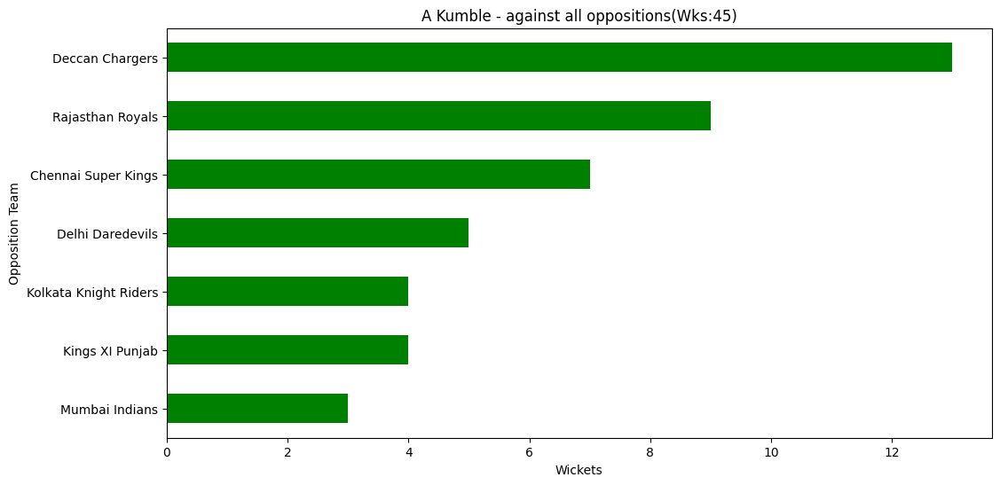

In [ ]:
show_player('A Kumble')

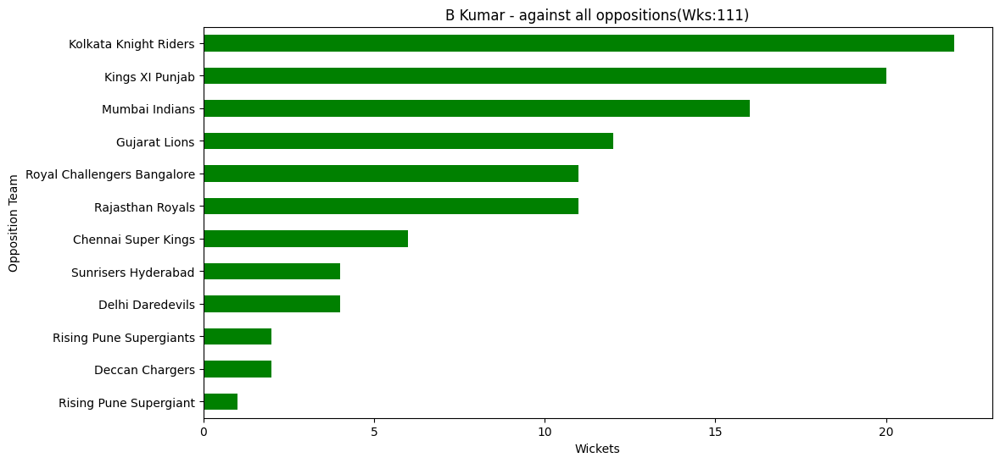

In [ ]:
show_player('B Kumar')

In [ ]:
mdf = matches.copy()

In [ ]:
mdf.head(1)

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,05-04-2017,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN


In [ ]:
#toos realted to winning match

In [ ]:
def wintoss_winmatch(toss_winner, winner):
  if toss_winner == winner:
   return 1
  else:
    return 0

In [ ]:
mdf['wintoss_winmatch']= mdf.apply(lambda x: wintoss_winmatch(x['toss_winner'], x['winner']), axis = 1)

In [ ]:
mdf[[ 'winner','toss_winner', 'wintoss_winmatch']].head(2)

,winner,toss_winner,wintoss_winmatch
0,Sunrisers Hyderabad,Royal Challengers Bangalore,0
1,Rising Pune Supergiant,Rising Pune Supergiant,1


In [ ]:
len(mdf[mdf.wintoss_winmatch == 1])/len(mdf)

0.5198412698412699

In [ ]:
len(mdf)

756

In [ ]:
len(mdf[mdf.wintoss_winmatch == 1])

393

In [ ]:
mdf.groupby(['season'])['wintoss_winmatch'].sum()
mdf.groupby(['season'])['wintoss_winmatch'].count()
mdf.groupby(['season'])['wintoss_winmatch'].sum()/mdf.groupby(['season'])['wintoss_winmatch'].count()

,wintoss_winmatch
season,
2008,0.482759
2009,0.578947
2010,0.516667
2011,0.520548
2012,0.445946
2013,0.473684
2014,0.500000
2015,0.474576
2016,0.566667


In [ ]:
#venue Avg runs

In [ ]:
mdf = mdf.rename(columns = {'id':'match_id'})

In [ ]:
cdf = pd.merge(df, mdf, on = 'match_id', how = 'left')

In [ ]:
cdf.head(1)

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder,isBowlerWk,isDot,isOne,isTwo,isThree,isFour,isSix,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3,wintoss_winmatch
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Hyderabad,05-04-2017,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN,0


In [ ]:
cdf.groupby(['venue'])['total_runs'].sum()

,total_runs
venue,
Barabati Stadium,2278
Brabourne Stadium,3842
Buffalo Park,799
De Beers Diamond Oval,897
Dr DY Patil Sports Academy,4810
Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium,3121
Dubai International Cricket Stadium,2064
Eden Gardens,18122
Feroz Shah Kotla,18421


In [ ]:
cdf.groupby(['venue'])['match_id'].apply(lambda x: len(x.unique()))

,match_id
venue,
Barabati Stadium,7
Brabourne Stadium,11
Buffalo Park,3
De Beers Diamond Oval,3
Dr DY Patil Sports Academy,17
Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium,11
Dubai International Cricket Stadium,7
Eden Gardens,61
Feroz Shah Kotla,60


In [ ]:
vdf= pd.DataFrame(cdf.groupby(['venue'])['total_runs'].sum()/(cdf.groupby(['venue'])['match_id'].apply(lambda x: len(x.unique()))*2))

In [ ]:
vdf.columns = ['Avg_runs']

In [ ]:
vdf.sort_values('Avg_runs', ascending = False).head(5)

,Avg_runs
venue,
Brabourne Stadium,174.636364
Saurashtra Cricket Association Stadium,166.650000
Barabati Stadium,162.714286
Green Park,162.250000
"Punjab Cricket Association IS Bindra Stadium, Mohali",161.136364


# PROBLEM STATEMENT - Optimal bowling strategy in Chinnaswamy, which bowlers and when to use throught the game.

In [ ]:
#Avg in 1st and 2nd innings,    Avg winning score    Avg RPW      Avg scoring rate RR

In [ ]:
def balls_per_dismissal(balls, dismissals):
  if dismissals > 0:
    return balls/dismissals
  else:
    return balls/1   #math.inf

def runs_per_balls(runs_conceeded, balls):
  if balls > 0:
    return runs_conceeded/balls
  else:
    return 100000    #math.inf

def runs_per_dismissal(runs_conceeded, dismissals):
  if dismissals > 0:
    return runs_conceeded/dismissals
  elif (runs_conceeded == 0):
    return 100000
  else:
    return runs_conceeded/1

In [ ]:
def bowler_stats(df, current_phase, current_venue):
  df = df[df.phase == current_phase]
  df = df[df.venue == current_venue]
  df.reset_index(drop = True, inplace = True)

  # Use filtered_df for calculations instead of df
  df['isDot'] = df.apply(lambda x: 1 if x['total_runs'] == 0 else 0, axis = 1)
  df['isOne'] = df.apply(lambda x: 1 if x['total_runs'] == 1 else 0, axis = 1)
  df['isTwo'] = df.apply(lambda x: 1 if x['total_runs'] == 2 else 0, axis = 1)
  df['isThree'] = df.apply(lambda x: 1 if x['total_runs'] == 3 else 0, axis = 1)
  df['isFour'] = df.apply(lambda x: 1 if x['batsman_runs'] == 4 else 0, axis = 1)
  df['isSix'] = df.apply(lambda x: 1 if x['batsman_runs'] == 6 else 0, axis = 1)

  # Use filtered_df for groupby operations
  runs = pd.DataFrame(df.groupby('bowler')['total_runs'].sum()).reset_index().rename(columns = {'total_runs':'runs'})
  innings = pd.DataFrame(df.groupby('bowler')['match_id'].nunique()).reset_index().rename(columns = {'match_id':'innings'})
  balls = pd.DataFrame(df.groupby('bowler')['match_id'].count()).reset_index().rename(columns = {'match_id':'balls'})
  dismissals = pd.DataFrame(df.groupby('bowler')['isBowlerWk'].sum()).reset_index().rename(columns = {'isBowlerWk':'dismissals'})
  dots = pd.DataFrame(df.groupby('bowler')['isDot'].sum()).reset_index().rename(columns = {'isDot':'dots'})
  # ... (rest of the groupby operations using filtered_df) ...

  # Merge the DataFrames
  df = pd.merge(innings, balls, on = 'bowler').merge(dismissals, on = 'bowler').merge(runs, on = 'bowler').merge(dots, on = 'bowler')
  df['dot%'] = df.apply(lambda x: x['dots']/x['balls']*100, axis = 1)

  df['SR']= df.apply(lambda x: balls_per_dismissal (x['balls'], x['dismissals']), axis = 1)
  df['Eco']= df.apply(lambda x: runs_per_balls(6*x['runs'], x['balls']), axis = 1)
  df['Avg']= df.apply(lambda x: runs_per_dismissal(x['runs'], x['dismissals']), axis = 1)

  return df

In [ ]:
cdf['over_no']= cdf['over'].apply(lambda x: x-1)

In [ ]:
def get_phase(over_no):
  if over_no < 6:
    return 'Powerplay'
  elif over_no < 16:
    return 'Middle'
  else:
    return 'Death'

In [ ]:
cdf['phase']= cdf['over_no'].apply(lambda x: get_phase(x))

In [ ]:
cdf.head(1)

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder,isBowlerWk,isDot,isOne,isTwo,isThree,isFour,isSix,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3,wintoss_winmatch,over_no,phase
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Hyderabad,05-04-2017,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN,0,0,Powerplay


In [ ]:
cdf[(cdf['venue']== 'M Chinnaswamy Stadium') & (cdf['phase'] == 'Powerplay')]

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder,isBowlerWk,isDot,isOne,isTwo,isThree,isFour,isSix,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3,wintoss_winmatch,over_no,phase
960,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,1,CH Gayle,SR Watson,Z Khan,0,0,0,0,0,0,1,0,1,NaN,NaN,NaN,0,0,1,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
961,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,2,SR Watson,CH Gayle,Z Khan,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN,0,0,0,0,0,1,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
962,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,3,SR Watson,CH Gayle,Z Khan,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
963,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,4,SR Watson,CH Gayle,Z Khan,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN,0,0,0,0,0,1,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
964,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,5,SR Watson,CH Gayle,Z Khan,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
965,5,1,Royal Challengers Bangalore,Delhi Daredevils,1,6,SR Watson,CH Gayle,Z Khan,0,0,0,0,0,0,1,0,1,NaN,NaN,NaN,0,0,1,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,0,Powerplay
966,5,1,Royal Challengers Bangalore,Delhi Daredevils,2,1,SR Watson,CH Gayle,CH Morris,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN,0,0,0,0,0,1,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,1,Powerplay
967,5,1,Royal Challengers Bangalore,Delhi Daredevils,2,2,SR Watson,CH Gayle,CH Morris,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,1,Powerplay
968,5,1,Royal Challengers Bangalore,Delhi Daredevils,2,3,SR Watson,CH Gayle,CH Morris,0,0,0,1,0,0,0,1,1,NaN,NaN,NaN,0,1,0,0,0,0,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,1,Powerplay
969,5,1,Royal Challengers Bangalore,Delhi Daredevils,2,4,CH Gayle,SR Watson,CH Morris,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN,0,0,0,0,0,1,0,2017,Bangalore,08-04-2017,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN,1,1,Powerplay


In [ ]:
df1 = bowler_stats(cdf, 'Powerplay', 'M Chinnaswamy Stadium')
df2 = bowler_stats(cdf, 'Middle', 'M Chinnaswamy Stadium')
df3 = bowler_stats(cdf, 'Death', 'M Chinnaswamy Stadium')

In [ ]:
np.mean(df1['SR']), np.mean(df2['SR']), np.mean(df3['SR'])

(18.789244663382593, 20.832405969634234, 10.513622364368635)

In [ ]:
np.mean(df1['Eco']), np.mean(df2['Eco']), np.mean(df3['Eco'])

(7.880727610278703, 8.304250946545842, 10.800024828324942)

In [ ]:
np.mean(df1['Avg']), np.mean(df2['Avg']), np.mean(df3['Avg'])

(23.603037766830873, 29.218972854842416, 18.985009207210698)

In [ ]:
np.mean(df1['dot%']), np.mean(df2['dot%']), np.mean(df3['dot%'])

(43.52129824368558, 29.777558008969027, 27.6117877825003)

In [ ]:
#in bowling analysis the dimensions for factors are varying and different
#Normalization => [0,1]
#Standardization (mean=0, std_dev =1), Zscore = (x-mean)/s

In [ ]:
#normalization we can use minmax technique
#maxval and minval
#minmax(x)= (x-minvalue)/(maxvalue-minvalue)  =>x == maxvalue - (1),  => x == minvalue - (0)

In [ ]:
#Example
ls1 = [7, 9, 16, 2, 10, 6]
min_val = min(ls1)
max_val = max(ls1)
ls2 = [(x-min_val)/(max_val-min_val) for x in ls1]
ls2

[0.35714285714285715, 0.5, 1.0, 0.0, 0.5714285714285714, 0.2857142857142857]

In [ ]:
df1= df1[df1.balls >= 25]

In [ ]:
max_val = max(df1['Eco'])
min_val = min(df1['Eco'])
df1['mx_Eco']= df1['Eco'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df1['SR'])
min_val = min(df1['SR'])
df1['mx_SR']= df1['SR'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df1['Avg'])
min_val = min(df1['Avg'])
df1['mx_Avg']= df1['Avg'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df1['dot%'])
min_val = min(df1['dot%'])
df1['mx_dot%']= df1['dot%'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
df1['minmax_score']= df1.apply(lambda x: x['mx_dot%']+ x['mx_SR']+ x['mx_Eco']+ x['mx_Avg'], axis = 1)

In [ ]:
# [Criterion	  SR	Avg	Eco	Dot%
#           SR	  1	  1	  3	  3
#           Avg	  1	  1	  3	  3
#           Eco	1/3	1/3	  1	  1
#           Dot%	1/3	1/3	1	  1

#weights = {'SR': 0.4, 'Avg': 0.4, 'Eco': 0.1, 'Dot%': 0.1}

In [ ]:
df1['minmax_score']= df1.apply(lambda x: x['mx_dot%']*0.1 + x['mx_SR']*0.4 + x['mx_Eco']*0.1 + x['mx_Avg']*0.4, axis = 1)

In [ ]:
df1.sort_values('minmax_score', ascending = True).head(10)

,bowler,innings,balls,dismissals,runs,dots,dot%,SR,Eco,Avg,mx_Eco,mx_SR,mx_Avg,mx_dot%,minmax_score
63,JJ Bumrah,4,34,3,22,22,64.705882,11.333333,3.882353,7.333333,0.039216,0.018476,0.001083,0.754230,0.087168
42,DS Kulkarni,4,55,7,50,33,60.000000,7.857143,5.454545,7.142857,0.257576,0.000000,0.000000,0.657534,0.091511
126,SP Narine,6,36,2,24,22,61.111111,18.000000,4.000000,12.000000,0.055556,0.053910,0.027620,0.680365,0.106204
62,JH Kallis,12,100,6,105,44,44.000000,16.666667,6.300000,17.500000,0.375000,0.046824,0.058895,0.328767,0.112664
39,DL Vettori,4,30,2,35,13,43.333333,15.000000,7.000000,17.500000,0.472222,0.037965,0.058895,0.315068,0.117473
8,AB Dinda,8,109,5,113,44,40.366972,21.800000,6.220183,22.600000,0.363914,0.074108,0.087896,0.254116,0.126605
111,S Aravind,19,248,14,273,116,46.774194,17.714286,6.604839,19.500000,0.417339,0.052392,0.070268,0.385771,0.129375
117,S Sreesanth,3,42,2,35,24,57.142857,21.000000,5.000000,17.500000,0.194444,0.069856,0.058895,0.598826,0.130827
135,TG Southee,3,39,3,52,18,46.153846,13.000000,8.000000,17.333333,0.611111,0.027335,0.057947,0.373024,0.132526
74,L Balaji,4,32,2,35,17,53.125000,16.000000,6.562500,17.500000,0.411458,0.043280,0.058895,0.516267,0.133643


In [ ]:
df2= df2[df2.balls >= 25]

In [ ]:
max_val = max(df2['Eco'])
min_val = min(df2['Eco'])
df2['mx_Eco']= df2['Eco'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df2['SR'])
min_val = min(df2['SR'])
df2['mx_SR']= df2['SR'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df2['Avg'])
min_val = min(df2['Avg'])
df2['mx_Avg']= df2['Avg'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df2['dot%'])
min_val = min(df2['dot%'])
df2['mx_dot%']= df2['dot%'].apply(lambda x: (x-min_val)/(max_val - min_val))

In [ ]:
df2['minmax_score']= df2.apply(lambda x: x['mx_dot%']+ x['mx_SR']+ x['mx_Eco']+ x['mx_Avg'], axis = 1)

In [ ]:
df2['minmax_score']= df2.apply(lambda x: x['mx_dot%']*0.05 + x['mx_SR']*0.4 + x['mx_Eco']*0.15 + x['mx_Avg']*0.4, axis = 1)

In [ ]:
df2.sort_values('minmax_score', ascending = True).head(20)

,bowler,innings,balls,dismissals,runs,dots,dot%,SR,Eco,Avg,mx_Eco,mx_SR,mx_Avg,mx_dot%,minmax_score
96,MA Starc,4,34,4,37,13,38.235294,8.500000,6.529412,9.250000,0.142980,0.000000,0.000000,0.701802,0.056537
39,CJ Jordan,5,59,6,67,19,32.203390,9.833333,6.813559,11.166667,0.175024,0.015066,0.015122,0.517598,0.064208
153,SK Trivedi,3,65,5,57,26,40.000000,13.000000,5.261538,11.400000,0.000000,0.050847,0.016963,0.755694,0.064909
118,PP Ojha,2,48,4,53,13,27.083333,12.000000,6.625000,13.250000,0.153760,0.039548,0.031558,0.361241,0.069568
151,SC Ganguly,1,25,2,23,11,44.000000,12.500000,5.520000,11.500000,0.029147,0.045198,0.017751,0.877847,0.073444
84,KV Sharma,4,85,7,91,30,35.294118,12.142857,6.423529,13.000000,0.131039,0.041162,0.029586,0.611984,0.078554
109,NM Coulter-Nile,2,30,2,28,12,40.000000,15.000000,5.600000,14.000000,0.038169,0.073446,0.037475,0.755694,0.087879
159,SR Watson,14,119,9,128,48,40.336134,13.222222,6.453782,14.222222,0.134451,0.053358,0.039229,0.765959,0.095500
10,AB Agarkar,2,34,2,36,15,44.117647,17.000000,6.352941,18.000000,0.123079,0.096045,0.069034,0.881440,0.128565
95,M Muralitharan,11,206,10,207,74,35.922330,20.600000,6.029126,20.700000,0.086562,0.136723,0.090335,0.631168,0.135366


In [ ]:
df3= df3[df3.balls >= 25]

In [ ]:
max_val = max(df3['Eco'])
min_val = min(df3['Eco'])
df3['mx_Eco']= df3['Eco'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df3['SR'])
min_val = min(df3['SR'])
df3['mx_SR']= df3['SR'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df3['Avg'])
min_val = min(df3['Avg'])
df3['mx_Avg']= df3['Avg'].apply(lambda x: (x-min_val)/(max_val-min_val))

In [ ]:
max_val = max(df3['dot%'])
min_val = min(df3['dot%'])
df3['mx_dot%']= df3['dot%'].apply(lambda x: (x-min_val)/(max_val - min_val))

In [ ]:
df3['minmax_score']= df3.apply(lambda x: x['mx_dot%']+ x['mx_SR']+ x['mx_Eco']+ x['mx_Avg'], axis = 1)

In [ ]:
df3['minmax_score']= df3.apply(lambda x: x['mx_dot%']*0.05 + x['mx_SR']*0.4 + x['mx_Eco']*0.15 + x['mx_Avg']*0.4 , axis = 1)

In [ ]:
df3.sort_values('minmax_score', ascending = True).head(10)

,bowler,innings,balls,dismissals,runs,dots,dot%,SR,Eco,Avg,mx_Eco,mx_SR,mx_Avg,mx_dot%,minmax_score
105,S Aravind,8,45,6,53,17,37.777778,7.500000,7.066667,8.833333,0.000000,0.022026,0.000000,1.000000,0.058811
37,D Wiese,4,26,4,42,5,19.230769,6.500000,9.692308,10.500000,0.317618,0.004405,0.014599,0.223614,0.066425
103,RP Singh,10,88,11,120,30,34.090909,8.000000,8.181818,10.909091,0.134897,0.030837,0.018182,0.845666,0.082125
18,AR Patel,4,32,3,42,10,31.250000,10.666667,7.875000,14.000000,0.097782,0.077827,0.045255,0.726744,0.100237
132,YS Chahal,6,31,4,57,6,19.354839,7.750000,11.032258,14.250000,0.479709,0.026432,0.047445,0.228807,0.112947
3,A Kumble,5,27,3,41,9,33.333333,9.000000,9.111111,13.666667,0.247312,0.048458,0.042336,0.813953,0.114112
5,A Nehra,3,25,4,47,7,28.000000,6.250000,11.280000,11.750000,0.509677,0.000000,0.025547,0.590698,0.116205
133,Z Khan,18,121,9,165,37,30.578512,13.444444,8.181818,18.333333,0.134897,0.126774,0.083212,0.698635,0.139161
63,KA Pollard,4,25,3,48,7,28.000000,8.333333,11.520000,16.000000,0.538710,0.036711,0.062774,0.590698,0.150135
61,JP Faulkner,2,25,2,40,7,28.000000,12.500000,9.600000,20.000000,0.306452,0.110132,0.097810,0.590698,0.158680


#Chinnaswamy Stadium, known for its high-scoring matches, requires a strategic approach to bowling. Analysis using the min-max score reveals key insights for optimal bowling strategy across different game phases:

#Powerplay: Bowlers like Jasprit Bumrah, Dhawal Kulkarni and Sunil Narine emerges as a top performers, excelling in economy rate and dot ball percentage. There ability to restrict runs and build pressure early on makes him a crucial asset in the powerplay.

#Middle Overs: It requires a combination of pacers and spinners like M Starc, Ch Jordan, Sunil Narine, Y Chahal,bowlers with exceptional strike rate and average make them a valuable weapon during the middle overs. They consistently picks up wickets and controls the flow of runs.

#Death Overs: Even in the death overs we have seen pacers and spinners both have taken wickets on regular intervals, spinners might be expensive sometimes but they bring break-through most often, boasting a low strike rate and average. Bowlers for taking wickets and limiting boundary opportunities proves crucial in the final stages of the game.

#Strategy

#The strategy involves deploying bowlers strategically based on their strengths during different phases of the game.

#By implementing this data-driven approach, a team can significantly optimize their bowling performance at Chinnaswamy Stadium, increasing their chances of success.